In [ ]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pickle
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
os.chdir('/content/drive/MyDrive/Capstone/')

In [ ]:
msn11_original = pd.read_csv('Copy of msn_37_fuel_leak_signals_preprocessed.csv', sep = ';')

In [ ]:
msn11_original.head(1)

,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,VALUE_FUEL_QTY_CT,VALUE_FUEL_QTY_FT1,VALUE_FUEL_QTY_FT2,VALUE_FUEL_QTY_FT3,VALUE_FUEL_QTY_FT4,VALUE_FUEL_QTY_LXT,VALUE_FUEL_QTY_RXT,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight,MSN
0,2016-07-27 13:31:37,NaN,NaN,NaN,36.0,19862.0,0.0,1928.0,2710.0,2560.0,1921.0,5405.0,5339.0,2.0,NaN,0.0,F-RBAJ


In [ ]:
# Define the column names as a list
column_names = [
    'VALUE_FUEL_QTY_CT',
    'VALUE_FUEL_QTY_FT1',
    'VALUE_FUEL_QTY_FT2',
    'VALUE_FUEL_QTY_FT3',
    'VALUE_FUEL_QTY_FT4',
    'VALUE_FUEL_QTY_LXT',
    'VALUE_FUEL_QTY_RXT'
]

msn11 = msn11_original.drop(column_names, axis = True)

In [ ]:
msn11 = msn11.drop(['MSN'], axis = True)

In [ ]:
msn11 = msn11[msn11['FLIGHT_PHASE_COUNT'] == 8.0]

In [ ]:
# Group the DataFrame by 'flights' column
grouped_flights = msn11.groupby('Flight')

# Define a function to calculate the percentage of missing values
def percent_missing_values(series):
    return series.isnull().mean() * 100

# Calculate the percentage of missing values for 'FUEL_USED_1' to 'FUEL_USED_4' for each group
missing_values_percentages = grouped_flights[['FUEL_USED_1', 'FUEL_USED_2', 'FUEL_USED_3', 'FUEL_USED_4']].apply(percent_missing_values)

# Drop flights where the percentage of missing values is 100%
valid_flights = missing_values_percentages[missing_values_percentages.mean(axis=1) < 100]

# Concatenate the remaining groups back into a DataFrame
df_filtered = pd.concat([grouped_flights.get_group(flight) for flight in valid_flights.index])

# Now, df_filtered contains flights where not all 'FUEL_USED_1' to 'FUEL_USED_4' columns have 100% missing values

In [ ]:
df_filtered.dropna()

,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight
33821,2016-08-16 12:29:02,531.809998,528.252380,523.025574,29998.0,19135.0,8.0,531.520386,5.0
33822,2016-08-16 12:29:03,532.141541,528.685181,523.363403,30010.0,19134.0,8.0,531.903503,5.0
33823,2016-08-16 12:29:04,532.568909,529.068176,523.795654,30003.0,19136.0,8.0,532.335571,5.0
33824,2016-08-16 12:29:05,532.947754,529.499207,524.179749,29989.0,19133.0,8.0,532.669495,5.0
33825,2016-08-16 12:29:06,533.373291,529.882629,524.612610,29996.0,19134.0,8.0,533.099121,5.0
...,...,...,...,...,...,...,...,...,...
3211230,2018-03-31 18:11:39,2476.850098,2509.704346,2482.359863,5263.0,13011.0,8.0,2473.860107,496.0
3211231,2018-03-31 18:11:40,2476.945312,2509.790771,2482.434570,5229.0,13013.0,8.0,2473.944824,496.0
3211232,2018-03-31 18:11:41,2477.030273,2509.887451,2482.531006,5199.0,13014.0,8.0,2474.028809,496.0
3211233,2018-03-31 18:11:42,2477.115479,2509.973877,2482.617188,5174.0,13017.0,8.0,2474.123047,496.0


In [ ]:
df_filtered['TOTAL_FUEL_USED'] = df_filtered[['FUEL_USED_1', 'FUEL_USED_2', 'FUEL_USED_3', 'FUEL_USED_4']].sum(axis=1)

In [ ]:
df_filtered['UTC_TIME'] = pd.to_datetime(df_filtered['UTC_TIME'])
df_filtered['time_diff'] = df_filtered.groupby('Flight')['UTC_TIME'].diff().dt.total_seconds().fillna(0)
# Calculate the cumulative sum of 'time_diff' within each group
grouped_flights = df_filtered.groupby('Flight')
df_filtered['SECONDS_PER_FLIGHT'] = grouped_flights['time_diff'].cumsum()
df_filtered['TOTAL_SECONDS_PER_FLIGHT'] = df_filtered.groupby('Flight')['SECONDS_PER_FLIGHT'].transform('max')

In [ ]:
df_filtered

,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight,TOTAL_FUEL_USED,time_diff,SECONDS_PER_FLIGHT,TOTAL_SECONDS_PER_FLIGHT
32771,2016-08-16 12:11:32,NaN,NaN,NaN,2140.0,20641.0,8.0,NaN,5.0,0.0,0.0,0.0,9929.0
32772,2016-08-16 12:11:33,NaN,NaN,NaN,2191.0,20631.0,8.0,NaN,5.0,0.0,1.0,1.0,9929.0
32773,2016-08-16 12:11:34,NaN,NaN,NaN,2241.0,20633.0,8.0,NaN,5.0,0.0,1.0,2.0,9929.0
32774,2016-08-16 12:11:35,NaN,NaN,NaN,2291.0,20578.0,8.0,NaN,5.0,0.0,1.0,3.0,9929.0
32775,2016-08-16 12:11:36,NaN,NaN,NaN,2338.0,20545.0,8.0,NaN,5.0,0.0,1.0,4.0,9929.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3211483,2018-03-31 18:15:52,NaN,NaN,NaN,1893.0,12340.0,8.0,NaN,496.0,0.0,1.0,7955.0,7959.0
3211484,2018-03-31 18:15:53,NaN,NaN,NaN,1875.0,12340.0,8.0,NaN,496.0,0.0,1.0,7956.0,7959.0
3211485,2018-03-31 18:15:54,NaN,NaN,NaN,1858.0,12344.0,8.0,NaN,496.0,0.0,1.0,7957.0,7959.0
3211486,2018-03-31 18:15:55,NaN,NaN,NaN,1842.0,12325.0,8.0,NaN,496.0,0.0,1.0,7958.0,7959.0


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


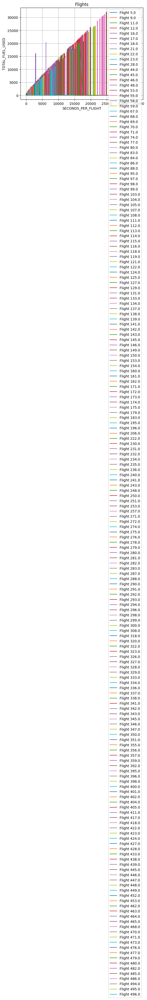

In [ ]:
# Group the DataFrame by 'flights' column
grouped_flights = df_filtered.groupby('Flight')

# Plot each flight separately
for flight, data in grouped_flights:
    plt.plot(data['SECONDS_PER_FLIGHT'], data['TOTAL_FUEL_USED'], label=f'Flight {flight}')

# Add labels and legend
plt.xlabel('SECONDS_PER_FLIGHT')
plt.ylabel('TOTAL_FUEL_USED')
plt.title('Flights')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


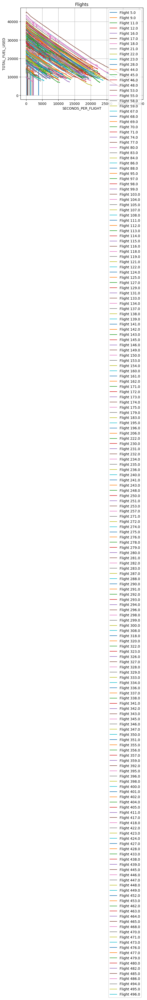

In [ ]:
# Group the DataFrame by 'flights' column
grouped_flights = df_filtered.groupby('Flight')

# Plot each flight separately
for flight, data in grouped_flights:
    plt.plot(data['SECONDS_PER_FLIGHT'], data['VALUE_FOB'], label=f'Flight {flight}')

# Add labels and legend
plt.xlabel('SECONDS_PER_FLIGHT')
plt.ylabel('TOTAL_FUEL_USED')
plt.title('Flights')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

In [ ]:
grouped_flights = df_filtered.groupby('Flight')

# Calculate the total duration of each flight
flight_durations = grouped_flights['SECONDS_PER_FLIGHT'].max()

# Filter out flights shorter than 500 seconds
valid_flights = flight_durations[flight_durations >= 1000]

# Drop rows corresponding to flights shorter than 500 seconds
df_filtered = df_filtered[df_filtered['Flight'].isin(valid_flights.index)]

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


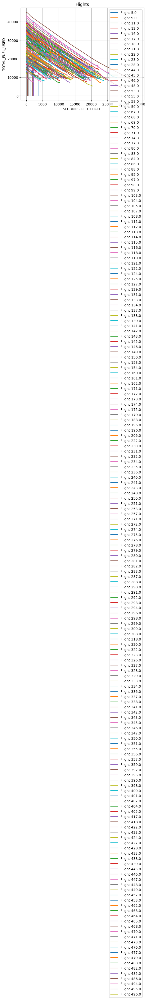

In [ ]:
# Group the DataFrame by 'flights' column
grouped_flights = df_filtered.groupby('Flight')

# Plot each flight separately
for flight, data in grouped_flights:
    plt.plot(data['SECONDS_PER_FLIGHT'], data['VALUE_FOB'], label=f'Flight {flight}')

# Add labels and legend
plt.xlabel('SECONDS_PER_FLIGHT')
plt.ylabel('TOTAL_FUEL_USED')
plt.title('Flights')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

In [ ]:
len(df_filtered['Flight'].unique())

189

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


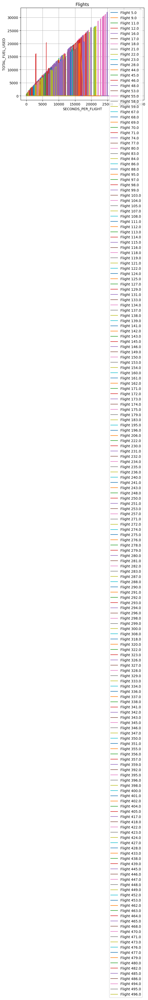

In [ ]:
# Group the DataFrame by 'flights' column
grouped_flights = df_filtered.groupby('Flight')

# Plot each flight separately
for flight, data in grouped_flights:
    plt.plot(data['SECONDS_PER_FLIGHT'], data['TOTAL_FUEL_USED'], label=f'Flight {flight}')

# Add labels and legend
plt.xlabel('SECONDS_PER_FLIGHT')
plt.ylabel('TOTAL_FUEL_USED')
plt.title('Flights')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

In [ ]:
df_fil = df_filtered.dropna()

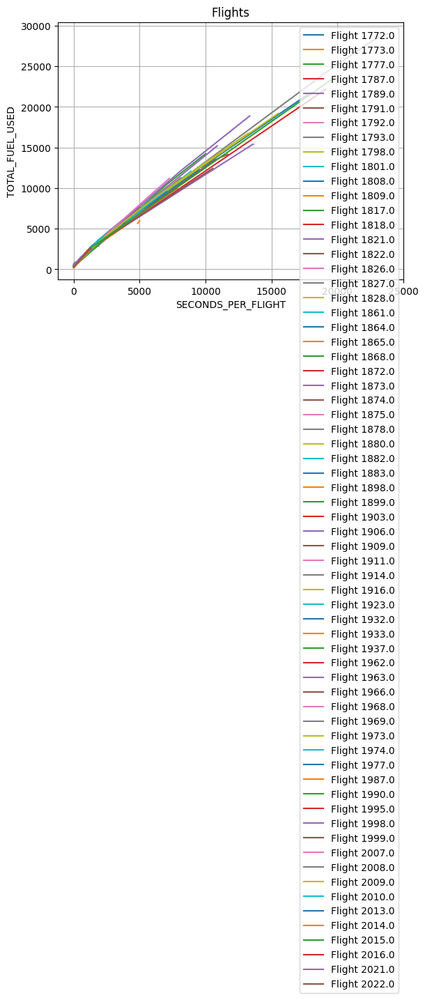

In [ ]:
# Group the DataFrame by 'flights' column
grouped_flights = df_fil.groupby('Flight')

# Plot each flight separately
for flight, data in grouped_flights:
    plt.plot(data['SECONDS_PER_FLIGHT'], data['TOTAL_FUEL_USED'], label=f'Flight {flight}')

# Add labels and legend
plt.xlabel('SECONDS_PER_FLIGHT')
plt.ylabel('TOTAL_FUEL_USED')
plt.title('Flights')
plt.legend()
plt.grid(True)

# Show the plot

In [ ]:
grouped_flights = df_fil.groupby('Flight')

# Calculate the total duration of each flight
flight_durations = grouped_flights['SECONDS_PER_FLIGHT'].max()

# Filter out flights shorter than 500 seconds
valid_flights = flight_durations[flight_durations >= 500]

# Drop rows corresponding to flights shorter than 500 seconds
df_fil = df_fil[df_fil['Flight'].isin(valid_flights.index)]

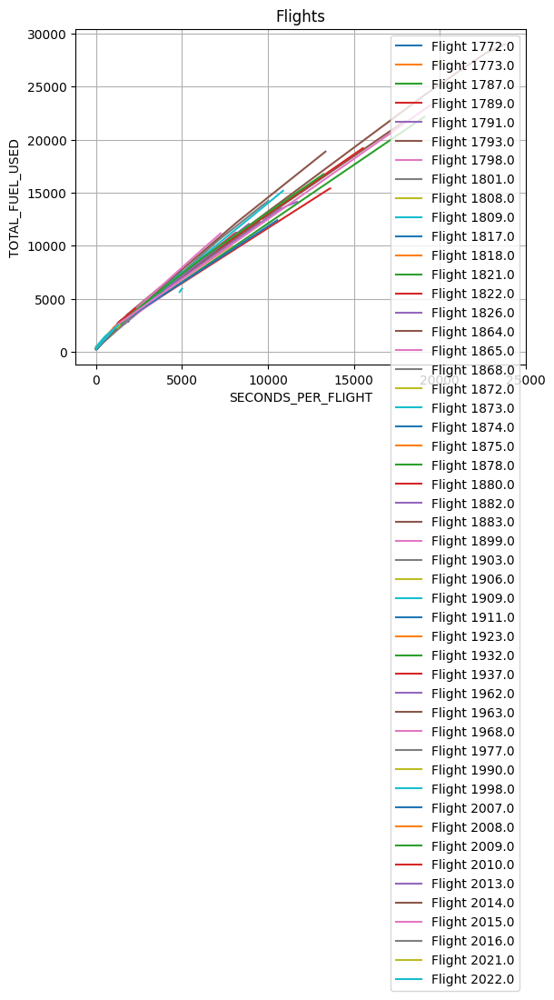

In [ ]:
# Group the DataFrame by 'flights' column
grouped_flights = df_fil.groupby('Flight')

# Plot each flight separately
for flight, data in grouped_flights:
    plt.plot(data['SECONDS_PER_FLIGHT'], data['TOTAL_FUEL_USED'], label=f'Flight {flight}')

# Add labels and legend
plt.xlabel('SECONDS_PER_FLIGHT')
plt.ylabel('TOTAL_FUEL_USED')
plt.title('Flights')
plt.legend()
plt.grid(True)

# Show the plot

In [ ]:
df_fil

,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight,TOTAL_FUEL_USED,time_diff,SECONDS_PER_FLIGHT,TOTAL_SECONDS_PER_FLIGHT
33821,2016-08-16 12:29:02,531.809998,528.252380,523.025574,29998.0,19135.0,8.0,531.520386,5.0,2114.608337,1.0,1050.0,9929.0
33822,2016-08-16 12:29:03,532.141541,528.685181,523.363403,30010.0,19134.0,8.0,531.903503,5.0,2116.093628,1.0,1051.0,9929.0
33823,2016-08-16 12:29:04,532.568909,529.068176,523.795654,30003.0,19136.0,8.0,532.335571,5.0,2117.768311,1.0,1052.0,9929.0
33824,2016-08-16 12:29:05,532.947754,529.499207,524.179749,29989.0,19133.0,8.0,532.669495,5.0,2119.296204,1.0,1053.0,9929.0
33825,2016-08-16 12:29:06,533.373291,529.882629,524.612610,29996.0,19134.0,8.0,533.099121,5.0,2120.967651,1.0,1054.0,9929.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3211230,2018-03-31 18:11:39,2476.850098,2509.704346,2482.359863,5263.0,13011.0,8.0,2473.860107,496.0,9942.774414,1.0,7702.0,7959.0
3211231,2018-03-31 18:11:40,2476.945312,2509.790771,2482.434570,5229.0,13013.0,8.0,2473.944824,496.0,9943.115479,1.0,7703.0,7959.0
3211232,2018-03-31 18:11:41,2477.030273,2509.887451,2482.531006,5199.0,13014.0,8.0,2474.028809,496.0,9943.477539,1.0,7704.0,7959.0
3211233,2018-03-31 18:11:42,2477.115479,2509.973877,2482.617188,5174.0,13017.0,8.0,2474.123047,496.0,9943.829590,1.0,7705.0,7959.0


In [ ]:
df_fil.to_csv('msn37_working.csv')

In [ ]:
df_fil = pd.read_csv('msn37_working.csv', sep = ',')

In [ ]:
df_fil

,Unnamed: 0,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight,TOTAL_FUEL_USED,time_diff,SECONDS_PER_FLIGHT,TOTAL_SECONDS_PER_FLIGHT
0,33821,2016-08-16 12:29:02,531.809998,528.252380,523.025574,29998.0,19135.0,8.0,531.520386,5.0,2114.608337,1.0,1050.0,9929.0
1,33822,2016-08-16 12:29:03,532.141541,528.685181,523.363403,30010.0,19134.0,8.0,531.903503,5.0,2116.093628,1.0,1051.0,9929.0
2,33823,2016-08-16 12:29:04,532.568909,529.068176,523.795654,30003.0,19136.0,8.0,532.335571,5.0,2117.768311,1.0,1052.0,9929.0
3,33824,2016-08-16 12:29:05,532.947754,529.499207,524.179749,29989.0,19133.0,8.0,532.669495,5.0,2119.296204,1.0,1053.0,9929.0
4,33825,2016-08-16 12:29:06,533.373291,529.882629,524.612610,29996.0,19134.0,8.0,533.099121,5.0,2120.967651,1.0,1054.0,9929.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92000,3211230,2018-03-31 18:11:39,2476.850098,2509.704346,2482.359863,5263.0,13011.0,8.0,2473.860107,496.0,9942.774414,1.0,7702.0,7959.0
92001,3211231,2018-03-31 18:11:40,2476.945312,2509.790771,2482.434570,5229.0,13013.0,8.0,2473.944824,496.0,9943.115479,1.0,7703.0,7959.0
92002,3211232,2018-03-31 18:11:41,2477.030273,2509.887451,2482.531006,5199.0,13014.0,8.0,2474.028809,496.0,9943.477539,1.0,7704.0,7959.0
92003,3211233,2018-03-31 18:11:42,2477.115479,2509.973877,2482.617188,5174.0,13017.0,8.0,2474.123047,496.0,9943.829590,1.0,7705.0,7959.0


In [ ]:
df_fil['FUSED_dif'] = df_fil['TOTAL_FUEL_USED'].diff()

In [ ]:
df_fil

,Unnamed: 0,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight,TOTAL_FUEL_USED,time_diff,SECONDS_PER_FLIGHT,TOTAL_SECONDS_PER_FLIGHT,FUSED_dif
0,33821,2016-08-16 12:29:02,531.809998,528.252380,523.025574,29998.0,19135.0,8.0,531.520386,5.0,2114.608337,1.0,1050.0,9929.0,NaN
1,33822,2016-08-16 12:29:03,532.141541,528.685181,523.363403,30010.0,19134.0,8.0,531.903503,5.0,2116.093628,1.0,1051.0,9929.0,1.485291
2,33823,2016-08-16 12:29:04,532.568909,529.068176,523.795654,30003.0,19136.0,8.0,532.335571,5.0,2117.768311,1.0,1052.0,9929.0,1.674683
3,33824,2016-08-16 12:29:05,532.947754,529.499207,524.179749,29989.0,19133.0,8.0,532.669495,5.0,2119.296204,1.0,1053.0,9929.0,1.527893
4,33825,2016-08-16 12:29:06,533.373291,529.882629,524.612610,29996.0,19134.0,8.0,533.099121,5.0,2120.967651,1.0,1054.0,9929.0,1.671448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92000,3211230,2018-03-31 18:11:39,2476.850098,2509.704346,2482.359863,5263.0,13011.0,8.0,2473.860107,496.0,9942.774414,1.0,7702.0,7959.0,0.352783
92001,3211231,2018-03-31 18:11:40,2476.945312,2509.790771,2482.434570,5229.0,13013.0,8.0,2473.944824,496.0,9943.115479,1.0,7703.0,7959.0,0.341064
92002,3211232,2018-03-31 18:11:41,2477.030273,2509.887451,2482.531006,5199.0,13014.0,8.0,2474.028809,496.0,9943.477539,1.0,7704.0,7959.0,0.362061
92003,3211233,2018-03-31 18:11:42,2477.115479,2509.973877,2482.617188,5174.0,13017.0,8.0,2474.123047,496.0,9943.829590,1.0,7705.0,7959.0,0.352051


In [ ]:
df_fil['FOB_CONSUMPTION'] = df_fil['VALUE_FOB']

# Gruppiere die Daten nach Flügen
grouped_by_flight = df_fil.groupby('Flight')

# Iteriere über die Gruppen
for flight, group_data in grouped_by_flight:
    # Iteriere über die Zeilen der aktuellen Fluggruppe
    for index, row in group_data.iterrows():
        # Berechne den Wert für 'EST_FOB' gemäß der Beschreibung
        if index > group_data.index.min():  # Überspringe die erste Zeile des Flugs
            previous_index = group_data.index[group_data.index.get_loc(index) - 1]  # Index der vorherigen Zeile
            previous_est_fob = df_fil.at[previous_index, 'FOB_CONSUMPTION']  # Wert von 'EST_FOB' in der vorherigen Zeile
            df_fil.at[index, 'FOB_CONSUMPTION'] = previous_est_fob - row['FUSED_dif']

In [ ]:
df_fil

,Unnamed: 0,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight,TOTAL_FUEL_USED,time_diff,SECONDS_PER_FLIGHT,TOTAL_SECONDS_PER_FLIGHT,FUSED_dif,FOB_CONSUMPTION
0,33821,2016-08-16 12:29:02,531.809998,528.252380,523.025574,29998.0,19135.0,8.0,531.520386,5.0,2114.608337,1.0,1050.0,9929.0,NaN,19135.000000
1,33822,2016-08-16 12:29:03,532.141541,528.685181,523.363403,30010.0,19134.0,8.0,531.903503,5.0,2116.093628,1.0,1051.0,9929.0,1.485291,19133.514709
2,33823,2016-08-16 12:29:04,532.568909,529.068176,523.795654,30003.0,19136.0,8.0,532.335571,5.0,2117.768311,1.0,1052.0,9929.0,1.674683,19131.840027
3,33824,2016-08-16 12:29:05,532.947754,529.499207,524.179749,29989.0,19133.0,8.0,532.669495,5.0,2119.296204,1.0,1053.0,9929.0,1.527893,19130.312134
4,33825,2016-08-16 12:29:06,533.373291,529.882629,524.612610,29996.0,19134.0,8.0,533.099121,5.0,2120.967651,1.0,1054.0,9929.0,1.671448,19128.640686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92000,3211230,2018-03-31 18:11:39,2476.850098,2509.704346,2482.359863,5263.0,13011.0,8.0,2473.860107,496.0,9942.774414,1.0,7702.0,7959.0,0.352783,13013.709106
92001,3211231,2018-03-31 18:11:40,2476.945312,2509.790771,2482.434570,5229.0,13013.0,8.0,2473.944824,496.0,9943.115479,1.0,7703.0,7959.0,0.341064,13013.368042
92002,3211232,2018-03-31 18:11:41,2477.030273,2509.887451,2482.531006,5199.0,13014.0,8.0,2474.028809,496.0,9943.477539,1.0,7704.0,7959.0,0.362061,13013.005981
92003,3211233,2018-03-31 18:11:42,2477.115479,2509.973877,2482.617188,5174.0,13017.0,8.0,2474.123047,496.0,9943.829590,1.0,7705.0,7959.0,0.352051,13012.653931


In [ ]:

# Define the degree of the polynomial
degree = 5  # Adjust as needed

# Function to apply polynomial smoothing within each flight group
def smooth_values(group):
    # Fit a polynomial curve to the data
    coeffs = np.polyfit(group.index, group['VALUE_FOB'], degree)
    poly = np.poly1d(coeffs)

    # Predict smoothed values using the polynomial curve
    group['Smoothed_Value'] = poly(group.index)
    return group

# Apply polynomial smoothing within each flight group and concatenate the results
smoothed_data = df_fil.groupby('Flight').apply(smooth_values)

# Sort the DataFrame by 'UTC_TIME' to restore the original order if needed
smoothed_data.sort_index(inplace=True)

# Save the smoothed values as a new column in the original DataFrame
df_fil['Smoothed_Value'] = smoothed_data['Smoothed_Value']

# Print the head of the DataFrame to verify the result
print(df_fil.head())

<ipython-input-87-408f82cb4153>:7: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(group.index, group['VALUE_FOB'], degree)
<ipython-input-87-408f82cb4153>:7: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(group.index, group['VALUE_FOB'], degree)
<ipython-input-87-408f82cb4153>:7: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(group.index, group['VALUE_FOB'], degree)
<ipython-input-87-408f82cb4153>:7: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(group.index, group['VALUE_FOB'], degree)
<ipython-input-87-408f82cb4153>:7: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(group.index, group['VALUE_FOB'], degree)
<ipython-input-87-408f82cb4153>:7: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(group.index, group['VALUE_FOB'], degree)
<ipython-input-87-408f82cb4153>:7: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(group.index, group['VALUE_

   Unnamed: 0             UTC_TIME  FUEL_USED_2  FUEL_USED_3  FUEL_USED_4  \
0       33821  2016-08-16 12:29:02   531.809998   528.252380   523.025574   
1       33822  2016-08-16 12:29:03   532.141541   528.685181   523.363403   
2       33823  2016-08-16 12:29:04   532.568909   529.068176   523.795654   
3       33824  2016-08-16 12:29:05   532.947754   529.499207   524.179749   
4       33825  2016-08-16 12:29:06   533.373291   529.882629   524.612610   

   FW_GEO_ALTITUDE  VALUE_FOB  FLIGHT_PHASE_COUNT  FUEL_USED_1  Flight  \
0          29998.0    19135.0                 8.0   531.520386     5.0   
1          30010.0    19134.0                 8.0   531.903503     5.0   
2          30003.0    19136.0                 8.0   532.335571     5.0   
3          29989.0    19133.0                 8.0   532.669495     5.0   
4          29996.0    19134.0                 8.0   533.099121     5.0   

   TOTAL_FUEL_USED  time_diff  SECONDS_PER_FLIGHT  TOTAL_SECONDS_PER_FLIGHT  \
0      2114.6

<ipython-input-87-408f82cb4153>:7: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(group.index, group['VALUE_FOB'], degree)
<ipython-input-87-408f82cb4153>:7: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(group.index, group['VALUE_FOB'], degree)
<ipython-input-87-408f82cb4153>:7: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(group.index, group['VALUE_FOB'], degree)
<ipython-input-87-408f82cb4153>:7: RankWarning: Polyfit may be poorly conditioned
  coeffs = np.polyfit(group.index, group['VALUE_FOB'], degree)
<ipython-input-87-408f82cb4153>:15: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group

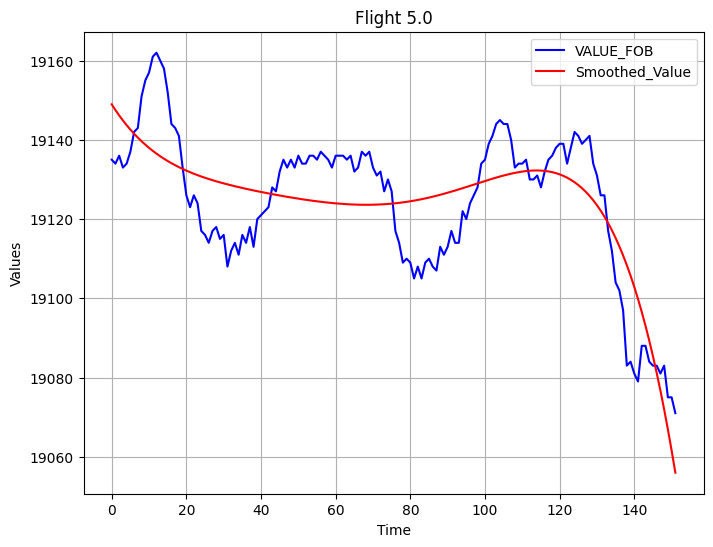

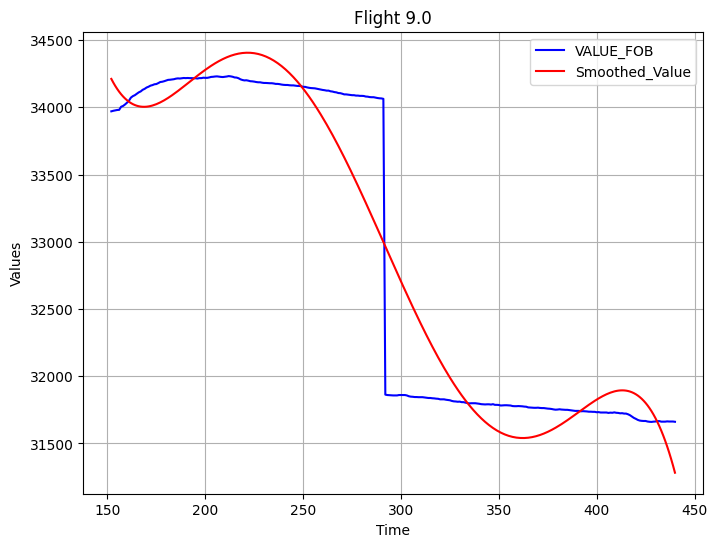

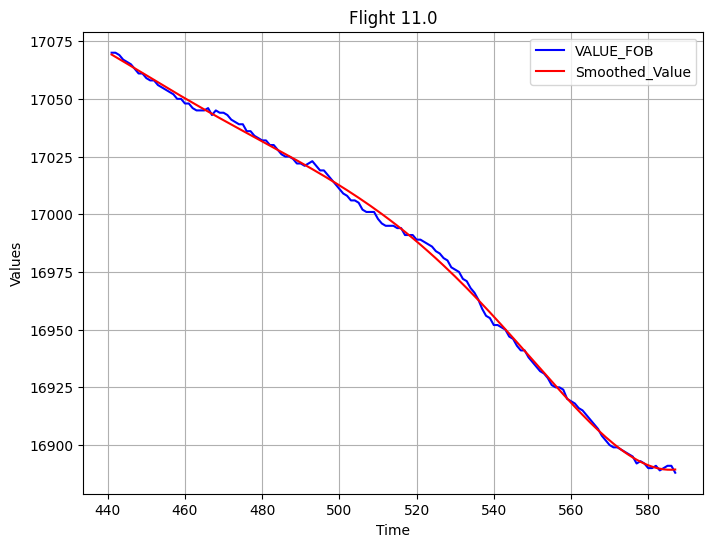

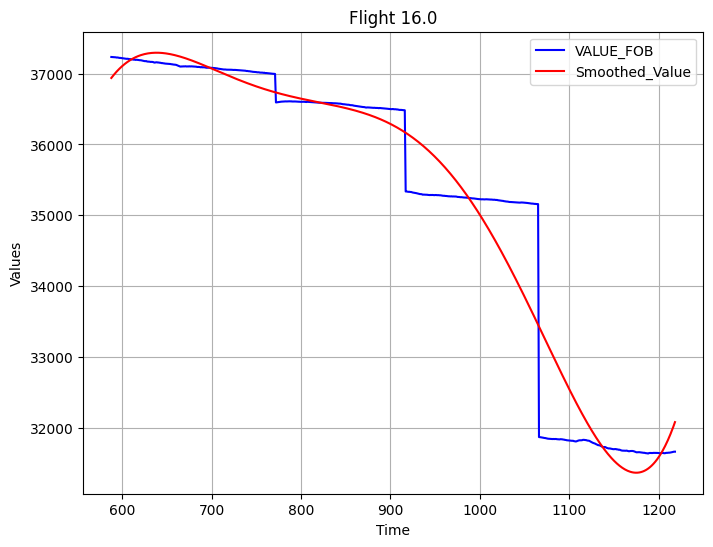

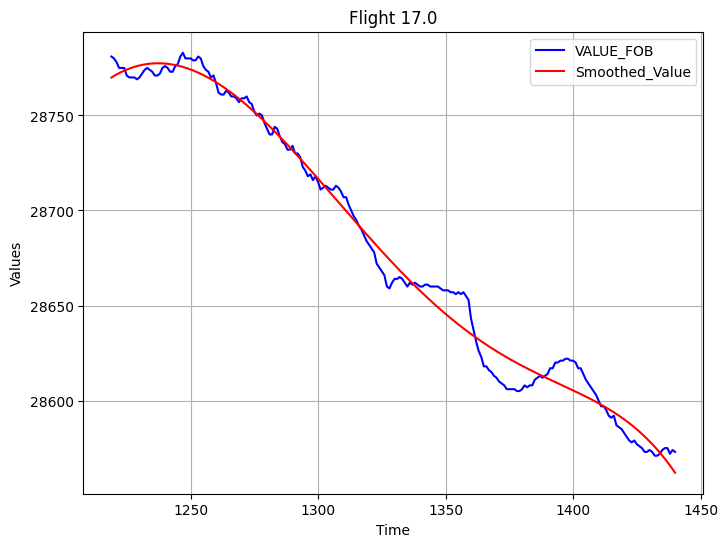

...

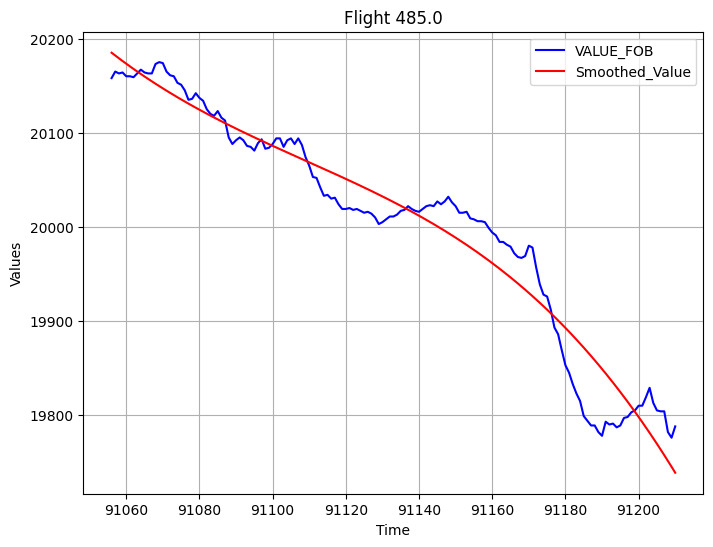

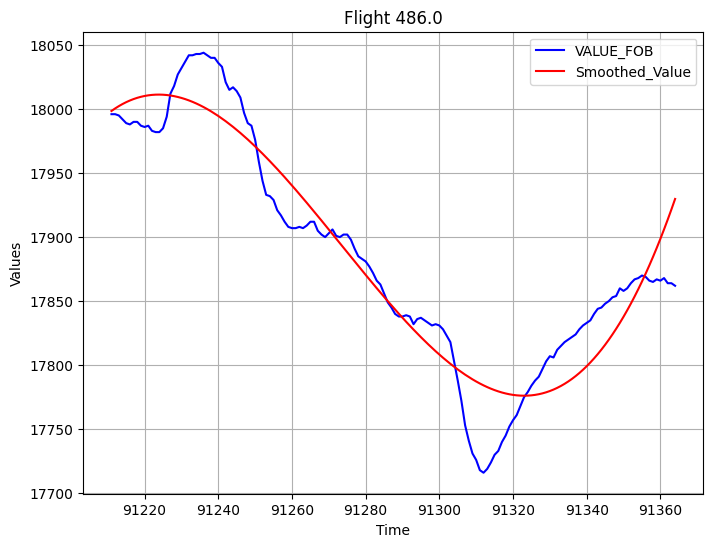

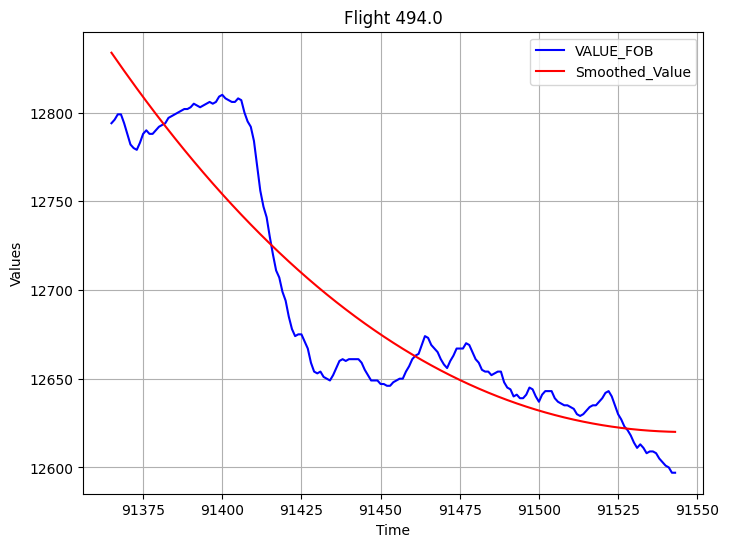

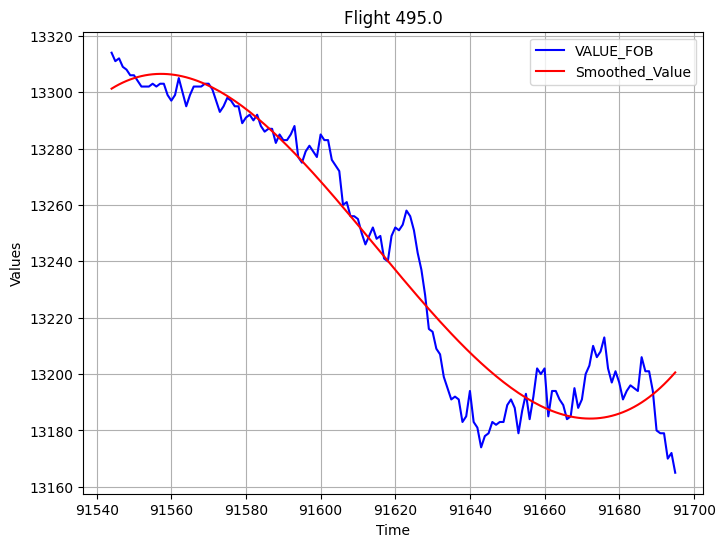

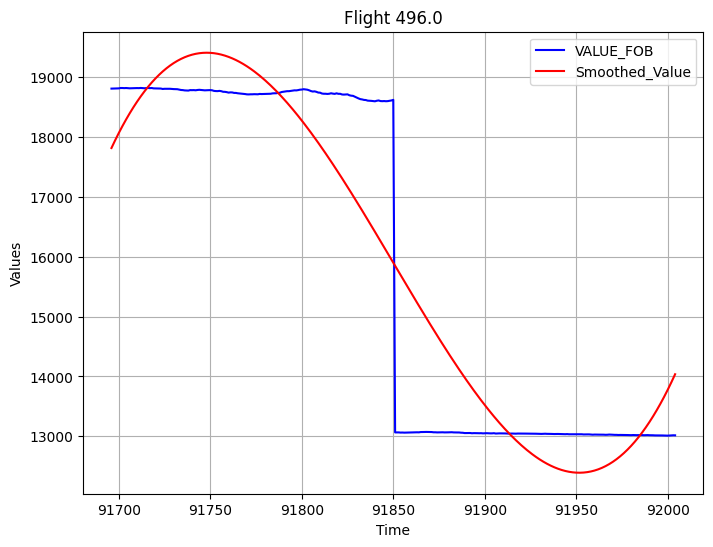

In [ ]:
#Group the data by flight
flight_groups = df_fil.groupby('Flight')

# Create a plot for each flight
for flight, flight_data in flight_groups:
    plt.figure(figsize=(8, 6))
    plt.plot(flight_data.index, flight_data['VALUE_FOB'], label='VALUE_FOB', color='blue')
    plt.plot(flight_data.index, flight_data['Smoothed_Value'], label='Smoothed_Value', color='red')
    plt.xlabel('Time')
    plt.ylabel('Values')
    plt.title(f'Flight {flight}')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
flights_to_drop = [
    5.0, 9.0, 16.0, 21.0, 44.0, 45.0, 48.0, 53.0, 55.0, 67.0, 71.0, 80.0, 84.0,
    98.0, 103.0, 105.0, 107.0, 108.0, 113.0, 121.0, 122.0, 125.0, 129.0, 133.0,
    134.0, 137.0, 138.0, 139.0, 141.0, 143.0, 149.0, 172.0, 173.0, 174.0, 175.0,
    183.0, 195.0, 206.0, 231.0, 232.0, 234.0, 236.0, 250.0, 251.0, 276.0, 278.0,
    279.0, 281.0, 287.0, 292.0, 294.0, 298.0, 299.0, 320.0, 323.0, 328.0, 333.0,
    336.0, 341.0, 343.0, 345.0, 347.0, 350.0, 356.0, 404.0, 405.0, 424.0, 428.0,
    433.0, 447.0, 448.0, 449.0, 462.0, 463.0, 464.0, 465.0, 468.0, 477.0, 482.0,
    486.0, 495.0, 496.0, 329.0
]

# Drop rows corresponding to flights in the list
df = df_fil[~df_fil['Flight'].isin(flights_to_drop)]

In [ ]:
df

,Unnamed: 0,UTC_TIME,FUEL_USED_2,FUEL_USED_3,FUEL_USED_4,FW_GEO_ALTITUDE,VALUE_FOB,FLIGHT_PHASE_COUNT,FUEL_USED_1,Flight,TOTAL_FUEL_USED,time_diff,SECONDS_PER_FLIGHT,TOTAL_SECONDS_PER_FLIGHT,FUSED_dif,FOB_CONSUMPTION,Smoothed_Value
441,95216,2016-08-23 12:30:37,670.639771,674.346924,667.465942,29977.0,17070.0,8.0,673.344482,11.0,2685.797119,1.0,1573.0,10387.0,-459.596558,17070.000000,17069.207858
442,95217,2016-08-23 12:30:38,670.945251,674.697754,667.774902,29983.0,17070.0,8.0,673.689575,11.0,2687.107483,1.0,1574.0,10387.0,1.310364,17068.689636,17068.225707
443,95218,2016-08-23 12:30:39,671.249878,675.008667,668.085266,29977.0,17069.0,8.0,673.998413,11.0,2688.342224,1.0,1575.0,10387.0,1.234741,17067.454895,17067.236401
444,95219,2016-08-23 12:30:40,671.596191,675.360046,668.433716,29976.0,17067.0,8.0,674.344849,11.0,2689.734802,1.0,1576.0,10387.0,1.392578,17066.062317,17066.241182
445,95220,2016-08-23 12:30:41,671.902893,675.671997,668.742493,29985.0,17066.0,8.0,674.653259,11.0,2690.970642,1.0,1577.0,10387.0,1.235840,17064.826477,17065.241215
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91539,3191585,2018-03-31 08:54:16,1244.897217,1257.286743,1242.921021,3082.0,12603.0,8.0,1243.175781,494.0,4988.280762,1.0,3470.0,6373.0,0.875977,12703.960327,12620.272156
91540,3191586,2018-03-31 08:54:17,1245.124023,1257.541138,1243.147705,3084.0,12601.0,8.0,1243.426758,494.0,4989.239624,1.0,3471.0,6373.0,0.958862,12703.001465,12620.195560
91541,3191587,2018-03-31 08:54:18,1245.389893,1257.807251,1243.414429,3085.0,12600.0,8.0,1243.660522,494.0,4990.272095,1.0,3472.0,6373.0,1.032471,12701.968994,12620.129627
91542,3191588,2018-03-31 08:54:19,1245.631226,1258.048462,1243.625732,3086.0,12597.0,8.0,1243.929077,494.0,4991.234497,1.0,3473.0,6373.0,0.962402,12701.006592,12620.074311


In [ ]:
df = df.drop(['VALUE_FOB', 'Unnamed: 0', 'FUEL_USED_1', 'FUEL_USED_2', 'FUEL_USED_3', 'FUEL_USED_4'], axis = True)
df = df.drop(['FLIGHT_PHASE_COUNT'], axis = True)
df['FOB_DIF'] = df.groupby('Flight')['Smoothed_Value'].diff()
df['FOB_vs_CONSUMPTION'] = df['Smoothed_Value'] - df['FOB_CONSUMPTION']
df['FOB_vs_CONSUMPTION_DIF'] = df.groupby('Flight')['FOB_vs_CONSUMPTION'].diff()
df.rename(columns={'Smoothed_Value': 'FOB'}, inplace=True)
df.to_csv('msn37_fortest.csv', sep = ',')

In [ ]:
df = df.drop(['time_diff'], axis = 1)

In [ ]:
df.loc[df['FUSED_dif'] < 0, 'FUSED_dif'] = 0.00

In [ ]:
df

,UTC_TIME,FW_GEO_ALTITUDE,Flight,TOTAL_FUEL_USED,SECONDS_PER_FLIGHT,TOTAL_SECONDS_PER_FLIGHT,FUSED_dif,FOB_CONSUMPTION,FOB,FOB_DIF,FOB_vs_CONSUMPTION,FOB_vs_CONSUMPTION_DIF
441,2016-08-23 12:30:37,29977.0,11.0,2685.797119,1573.0,10387.0,0.000000,17070.000000,17069.207858,NaN,-0.792142,NaN
442,2016-08-23 12:30:38,29983.0,11.0,2687.107483,1574.0,10387.0,1.310364,17068.689636,17068.225707,-0.982150,-0.463929,0.328213
443,2016-08-23 12:30:39,29977.0,11.0,2688.342224,1575.0,10387.0,1.234741,17067.454895,17067.236401,-0.989306,-0.218494,0.245435
444,2016-08-23 12:30:40,29976.0,11.0,2689.734802,1576.0,10387.0,1.392578,17066.062317,17066.241182,-0.995219,0.178865,0.397359
445,2016-08-23 12:30:41,29985.0,11.0,2690.970642,1577.0,10387.0,1.235840,17064.826477,17065.241215,-0.999967,0.414738,0.235873
...,...,...,...,...,...,...,...,...,...,...,...,...
91539,2018-03-31 08:54:16,3082.0,494.0,4988.280762,3470.0,6373.0,0.875977,12703.960327,12620.272156,-0.087298,-83.688172,0.788678
91540,2018-03-31 08:54:17,3084.0,494.0,4989.239624,3471.0,6373.0,0.958862,12703.001465,12620.195560,-0.076595,-82.805905,0.882267
91541,2018-03-31 08:54:18,3085.0,494.0,4990.272095,3472.0,6373.0,1.032471,12701.968994,12620.129627,-0.065933,-81.839367,0.966537
91542,2018-03-31 08:54:19,3086.0,494.0,4991.234497,3473.0,6373.0,0.962402,12701.006592,12620.074311,-0.055315,-80.932281,0.907087


In [ ]:
df.to_csv('msn37_fortest.csv', sep = ',')